In [4]:
import os
import pynwb
import h5py
from tqdm import tqdm
import pandas as pd
from pathlib import Path
import numpy as np
import seaborn as sns
import pywt
import matplotlib
import graph
import time

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib import gridspec

from scipy import signal
from scipy.fftpack import next_fast_len
from scipy.io import loadmat
from scipy.ndimage import gaussian_filter1d
from scipy.signal import filtfilt, hilbert, remez, sosfiltfilt, butter

import load_data
import LFP

In [1]:
# changed it to np.float32, and make it easier to access as big data
# Load your old file (object dtype)

for date in ['031723','032023','032823','033123','040423','040723']:

    old_data = np.load("D:/Theta/Session %s, theta.npz" % date, allow_pickle=True)
    
    # Convert numeric arrays to float32
    band_sig = old_data['arr_0'].astype(np.float32)
    power    = old_data['arr_1'].astype(np.float32)**2   
    phase  = old_data['arr_2'].astype(np.float32)  
    
    # Save to HDF5
    with h5py.File("D:/Theta/Session_%s_theta.h5" % date, "w") as f:
        
        f.create_dataset("band_sig", data=band_sig, dtype='float32')
        f.create_dataset("power", data=power, dtype='float32')
        f.create_dataset("phase", data=phase, dtype='float32')

NameError: name 'np' is not defined

In [5]:
class ThetaDataset:
    
    def __init__(self, h5_path):
        self.f = h5py.File(h5_path, 'r')
        self.band_sig = self.f['band_sig']
        self.power = self.f['power']
        self.phase = self.f['phase']

    def get_trace(self, time):
        return self.band_sig[time, :].T, self.power[time, :].T, self.phase[time, :].T

    def get_band_sig(self, time):
        if len(time)==0:
            return self.band_sig[:]
        else:
            return self.band_sig[time, :]

    def get_power(self, time):
        if len(time)==0:
            return self.power[:]
        else:
            return self.power[time, :]

    def get_phase(self, time):
        if len(time)==0:
            return self.phase[:]
        else:
            return self.phase[time, :]

    def close(self):
        self.f.close()

In [6]:
sz1 = 12
sz2 = 18
sns.set(style="ticks", rc={"lines.linewidth": 1.5})
matplotlib.rc('xtick', labelsize=sz1) 
matplotlib.rc('ytick', labelsize=sz1) 
matplotlib.rc('axes', labelsize=sz1)  
matplotlib.rc('axes', titlesize=sz1)  
matplotlib.rc('figure', titlesize=sz2)
matplotlib.rc('legend', fontsize=sz1) 
matplotlib.rc('legend', title_fontsize=sz1)
matplotlib.rcParams['axes.spines.right'] = False
matplotlib.rcParams['axes.spines.top'] = False

In [7]:
def epoch_aligned_lfp(date,df,window):
    
    timestamps, lfpData = load_data.load_LFP(date)
    num_ch = lfpData.shape[1]
    aligned_lfp = np.zeros((len(df),num_ch,window[1]-window[0]))  # 1 if happened during ITI, 0 if during a trial
    
    for ii in range(len(df)):

        on = df.iloc[ii].t_on.astype(float)
        idx = (timestamps>on+window[0]) & (timestamps<on+window[1])
        aligned_lfp[ii,:,:] = lfpData[idx,:].T.astype(np.float32)
    
    return aligned_lfp

In [8]:
def epoch_aligned_band(date,df,window):


    timestamps, lfpData = load_data.load_LFP(date)
    ds = ThetaDataset("D:/Theta/Session_%s_theta.h5" % date)
    
    num_ch = ds.band_sig.shape[1]
    aligned_lfp = np.zeros((len(df),num_ch,window[1]-window[0])).astype(np.float32)
    aligned_signal = np.zeros((len(df),num_ch,window[1]-window[0])).astype(np.float32)
    aligned_power = np.zeros((len(df),num_ch,window[1]-window[0])).astype(np.float32)
    aligned_phase = np.zeros((len(df),num_ch,window[1]-window[0])).astype(np.float32)
    
    for ii in range(len(df)):

        on = df.iloc[ii].t_on.astype(float)
        idx = (timestamps>on+window[0]) & (timestamps<on+window[1])
        aligned_lfp[ii,:,:] = lfpData[idx,:].T.astype(np.float32)
        aligned_signal[ii,:,:], aligned_power[ii,:,:], aligned_phase[ii,:,:] = ds.get_trace(idx)

    ds.close()
    
    return {'LFP': aligned_lfp,
            'band': aligned_signal, 
            'power': aligned_power, 
            'phase': aligned_phase}

In [9]:
def get_phase_channel(phase_align):
    
    # find the channel with highest theta cross-trial phase alignment
    OFC_phase = phase_align[:96,:,:]
    idx = np.argmax(OFC_phase)                 # flat index
    OFC_channel, _, _ = np.unravel_index(idx, OFC_phase.shape)
    
    HPC_phase = phase_align[96:,:,:]
    idx = np.argmax(HPC_phase)                 # flat index
    channel_idx, _, _ = np.unravel_index(idx, HPC_phase.shape)
    HPC_channel = np.arange(96,phase_align.shape[0])[channel_idx]

    return OFC_channel, HPC_channel

In [10]:
def get_spectrum(trial_data, fs = 1000, wavelet = 'cmor3.0-1.5'):

    frequencies = np.logspace(np.log10(1), np.log10(50), 20) / fs
    scale = pywt.frequency2scale(wavelet, frequencies)
    coeffs, freqs = pywt.cwt(trial_data, scale, wavelet, sampling_period=1/fs)

    return coeffs, freqs

In [11]:
def plot_spectrum(wavelet_spectrum, freq, band, normalization, ax):

    idx = (freq>band[0]) & (freq<band[1])
    freq = freq[idx]
    wavelet_spectrum = wavelet_spectrum[idx,:]

    if normalization:
        mean = wavelet_spectrum.mean(axis=1,keepdims=True)
        std = wavelet_spectrum.std(axis=1,keepdims=True)
        zscored = (wavelet_spectrum-mean)/std
    else:
        zscored = wavelet_spectrum

    # if normalization:
    #     cmin=-3
    #     cmax=3
    # else:
    #     cmin, cmax = np.percentile(zscored.mean(axis=1),[5,95])
    
    cmin = 0.00005
    cmax=0.0017
    norm = mcolors.Normalize(vmin=cmin, vmax=cmax, clip=True)
    
    c = ax.contourf(
        np.arange(zscored.shape[1]),
        freq,
        zscored,
        levels = 100,
        norm = norm,
        cmap='jet'
        # vmin=0, vmax=0.1,  # ✅ consistent color scale
        # levels = np.linspace(0, 0.11, 100)
    )

    ax.set_xlim(0,coeffs.shape[1])

    return c

Text(0.5, 0.98, 'Session 031723, OFC channel 24')

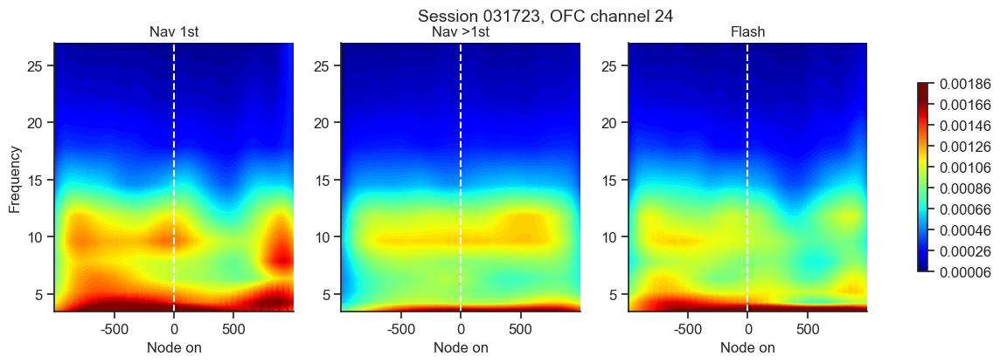

In [161]:
fig, axes = plt.subplots(1,3,figsize=(15,4))
c0 = plot_spectrum(power1.mean(axis=0), freqs, [3,30], 0, axes[1])
plot_spectrum(power2.mean(axis=0), freqs, [3,30], 0, axes[0])
plot_spectrum(power3.mean(axis=0), freqs, [3,30], 0, axes[2])
fig.colorbar(c0, ax=axes, shrink=0.7)

for ii in range(3):
    axes[ii].set_xticks([100,200,300])
    axes[ii].set_xticklabels([-500,0,500])
    axes[ii].set_xlabel('Node on')
    axes[ii].axvline(200,color='w',ls='--')

axes[0].set_title('Nav 1st')
axes[1].set_title('Nav >1st')
axes[2].set_title('Flash')

# ax.set_yticks(np.arange(5,50,5))

axes[0].set_ylabel('Frequency')
# plt.xlabel('Node on')
plt.suptitle('Session %s, OFC channel 24'%date,fontsize=14)
# plt.savefig('D:/Theta/Session %s, HPC channel 127, nav successive steps, spectrogram, node on -1000 1000ms'%date)

In [12]:
# load data
date = '031723'
phase_align = np.load('D:/Theta/Session %s, theta phase alignment.npz' % date)['arr_0']
nwbfile = load_data.load_nwbfile('Bart',date) 

query = 'trialerror<2'
trial_df = nwbfile.intervals['trials'].to_dataframe().query(query)
trial_df['t_on']=trial_df['start_time']

node_df = nwbfile.intervals['node_on'].to_dataframe().query(query)
# action_df = nwbfile.intervals['action_on'].to_dataframe().query(query)
# reward_df = nwbfile.intervals['reward_on'].to_dataframe().query(query)
# fix_df = nwbfile.intervals['fixations'].to_dataframe().query(query)

# get aligned_power for all trials
trial_aligned = epoch_aligned_band(date,trial_df,[-3000,1000])
# node_aligned = epoch_aligned_band(date,node_df,[-1000,1000])
# action_aligned = epoch_aligned_band(date,action_df,[-1000,1000])
# reward_aligned = epoch_aligned_band(date,reward_df,[-1000,3000])
# fix_aligned = epoch_aligned_band(date,fix_df,[-500,500])

In [140]:
# load data
# for date in ['031723','032023','032823','033123','040423','040723']:

date = '031723'
phase_align = np.load('D:/Theta/Session %s, theta phase alignment.npz' % date)['arr_0']
nwbfile = load_data.load_nwbfile('Bart',date) 

query = '(trialerror==0) & (step>0)'
node_df = nwbfile.intervals['node_on'].to_dataframe().query(query)
node_aligned1 = epoch_aligned_band(date,node_df,[-1000,1000])

query = '(trialerror==0) & (step==0)'
node_df = nwbfile.intervals['node_on'].to_dataframe().query(query)
node_aligned2 = epoch_aligned_band(date,node_df,[-1000,1000])

query = '(trialerror==1)'
node_df = nwbfile.intervals['node_on'].to_dataframe().query(query)
node_aligned3 = epoch_aligned_band(date,node_df,[-1000,1000])

# reward_df = nwbfile.intervals['reward_on'].to_dataframe().query(query)
# reward_aligned = epoch_aligned_band(date,reward_df,[-1000,3000])


In [16]:
n_trials = trial_aligned['LFP'].shape[0]
nchannels = trial_aligned['LFP'].shape[1]
psd = np.zeros((nchannels,n_trials,101))

for ch in range(nchannels):
    for trial in range(n_trials):
        psd_freqs, psd[ch,trial,:] = signal.welch(LFP.preprocess_LFP(trial_aligned['LFP'][trial,ch,::5]), fs=200, nperseg=200, noverlap=180)

KeyboardInterrupt: 

In [ ]:
unitNames = nwbfile.units.to_dataframe()
probes = unitNames.drop_duplicates('probe')
probes['subfield']

In [34]:
psd = np.zeros((nchannels,n_trials,101))
ch=127
for trial in range(n_trials):
    psd_freqs, psd[ch,trial,:] = signal.welch(trial_aligned['LFP'][trial,ch,::5], fs=200, nperseg=200, noverlap=180)

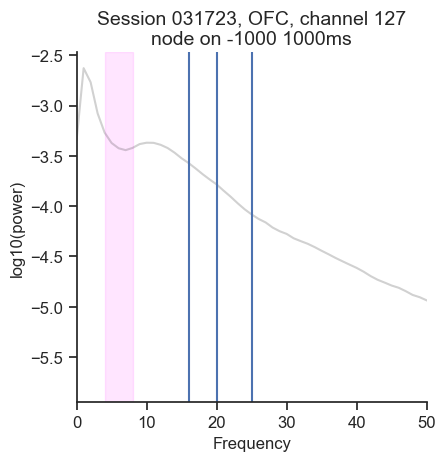

In [35]:
plt.close('all')
fig, ax = plt.subplots(figsize=(5,5))
# for ii in range(32):
ii=127
plt.plot(psd_freqs,np.log10(psd[ii,:,:].mean(axis=0)),color='k',alpha=0.2)
plt.xlim(0,50)
plt.ylabel('log10(power)')
plt.xlabel('Frequency')
plt.axvspan(4,8,color='magenta',alpha=0.1)
ax.set_position([0.15,0.15,0.7,0.7])
plt.title('Session %s, OFC, channel %i\nnode on -1000 1000ms'%(date,ii),fontsize=14)
plt.axvline(16)
plt.axvline(20)
plt.axvline(25)

# plt.savefig('D:/Theta/Session %s, psd, nav successive steps, OFC channel %i, node on -1000 1000ms'%(date,ii))

In [155]:
channel = 24
n_trials = node_aligned1['LFP'].shape[0]
power1 = np.zeros((n_trials,20,400))
for trial in tqdm(range(n_trials)):
    coeffs, freqs = get_spectrum(LFP.preprocess_LFP(node_aligned1['LFP'][trial,channel,:])[::5], fs=200)
    power1[trial,:,:] = np.abs(coeffs)**2

n_trials = node_aligned2['LFP'].shape[0]
power2 = np.zeros((n_trials,20,400))
for trial in tqdm(range(n_trials)):
    coeffs, freqs = get_spectrum(LFP.preprocess_LFP(node_aligned2['LFP'][trial,channel,:])[::5], fs=200)
    power2[trial,:,:] = np.abs(coeffs)**2

n_trials = node_aligned3['LFP'].shape[0]
power3 = np.zeros((n_trials,20,400))
for trial in tqdm(range(n_trials)):
    coeffs, freqs = get_spectrum(LFP.preprocess_LFP(node_aligned3['LFP'][trial,channel,:])[::5], fs=200)
    power3[trial,:,:] = np.abs(coeffs)**2

100%|██████████| 228/228 [00:02<00:00, 88.98it/s]


Text(0.5, 1.0, 'Session 031723, HPC channel 127')

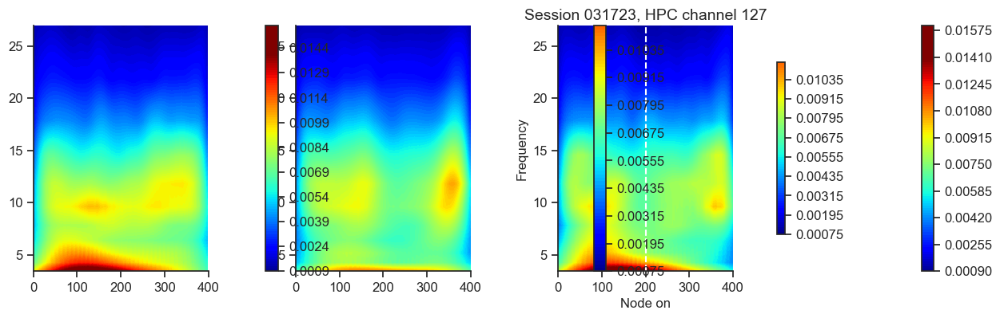

In [148]:
fig, axes = plt.subplots(1,3,figsize=(15,4))
c0 = plot_spectrum(power1.mean(axis=0), freqs, [3,30], 0, axes[1])
plot_spectrum(power2.mean(axis=0), freqs, [3,30], 0, axes[0])
plot_spectrum(power3.mean(axis=0), freqs, [3,30], 0, axes[2])
fig.colorbar(c0, ax=axes, shrink=0.7)

ax.set_xticks([100,200,300])
ax.set_xticklabels([-500,0,500])
# ax.set_yticks(np.arange(5,50,5))
plt.axvline(200,color='w',ls='--')
plt.ylabel('Frequency')
plt.xlabel('Node on')
plt.title('Session %s, HPC channel 127'%date,fontsize=14)
# plt.savefig('D:/Theta/Session %s, HPC channel 127, nav successive steps, spectrogram, node on -1000 1000ms'%date)

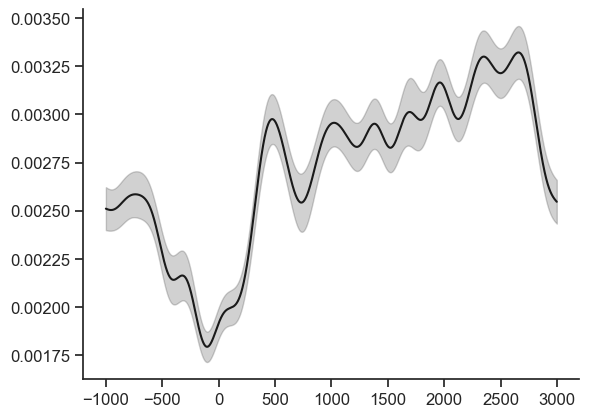

In [142]:
plt.close('all')
fig, axes = plt.subplots()
plot_mean_sem(np.arange(-1000,3000),reward_aligned['power'][:,127,:],0,axes,'k','')

In [105]:
def get_conditioned_signal(mode,channel,idx1,idx2,idx3,idx4):

    signal_along_trial = [trial_aligned[mode][idx1,channel,:],
                         node_aligned[mode][idx2,channel,:],
                         action_aligned[mode][idx3,channel,:],
                         reward_aligned[mode][idx4,channel,:]]

    return signal_along_trial

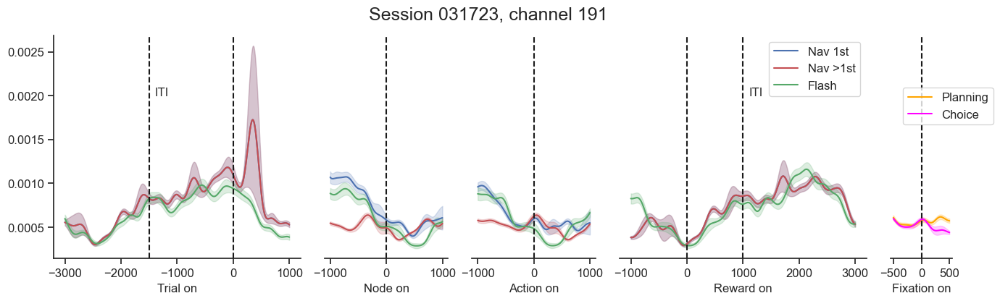

In [70]:
# plot power averaged across trials

for channel in range(phase_align.shape[0]):
    
    plt.close('all')
    
    xlims = [
        (-3000, 1000),
        (-1000, 1000),
        (-1000, 1000),
        (-1000, 3000),
        (-500,500)
    ]
    
    # Compute width ratios proportional to x-range
    width_ratios = [x2 - x1 for (x1, x2) in xlims]
    
    fig = plt.figure(figsize=(16, 4))
    gs = gridspec.GridSpec(1, 5, figure=fig, width_ratios=width_ratios, wspace=0.15)
    
    axes = []
    for i in range(5):
        if i == 0:
            ax = fig.add_subplot(gs[0, i])            # first panel
        else:
            ax = fig.add_subplot(gs[0, i], sharey=axes[0])  # share y with panel 0
        axes.append(ax)
        
    colors = ['']
    xlabels = ['Trial on', 'Node on', 'Action on', 'Reward on']
    
    
    power_along_trial = get_conditioned_signal('power',channel,
                                              trial_df.trialerror==0,
                                             (node_df.trialerror==0) & (node_df.step==0),
                                             (action_df.trialerror==0) & (action_df.step==0),
                                             reward_df.trialerror==0)
    
    for ii in range(4):
        timestamps = np.arange(xlims[ii][0],xlims[ii][1])
        plot_mean_sem(timestamps,power_along_trial[ii],0,axes[ii],'b','Nav 1st')
        axes[ii].set_xlabel(xlabels[ii])
    
    
    
    power_along_trial = get_conditioned_signal('power',channel,
                                              trial_df.trialerror==0,
                                             (node_df.trialerror==0) & (node_df.step>0),
                                             (action_df.trialerror==0) & (action_df.step>0),
                                             reward_df.trialerror==0)
    for ii in range(4):
        timestamps = np.arange(xlims[ii][0],xlims[ii][1])
        plot_mean_sem(timestamps,power_along_trial[ii],0,axes[ii],'r','Nav >1st')
        axes[ii].set_xlabel(xlabels[ii])
    
    
    
    power_along_trial = get_conditioned_signal('power',channel,
                                              trial_df.trialerror==1,
                                             (node_df.trialerror==1) & (node_df.step==0),
                                             (action_df.trialerror==1) & (action_df.step==0),
                                             reward_df.trialerror==1)
    for ii in range(4):
        timestamps = np.arange(xlims[ii][0],xlims[ii][1])
        plot_mean_sem(timestamps,power_along_trial[ii],0,axes[ii],'g','Flash')
        axes[ii].set_xlabel(xlabels[ii])
        axes[ii].axvline(0,color='k',ls='--')
        if ii==0:
            axes[ii].axvline(-1500,color='k',ls='--')
            axes[ii].text(-1400,0.002,'ITI')
        if ii==3:
            axes[ii].axvline(1000,color='k',ls='--')
            axes[ii].text(1100,0.002,'ITI')  
        if ii>0:
            axes[ii].yaxis.set_visible(False)
            axes[ii].spines['left'].set_visible(False)
    axes[ii].legend()
    
    # fixations
    idx = (fix_df.duration>50) & (fix_df.duration<300) & (fix_df.active_prob<0.2)
    plot_mean_sem(np.arange(-500,500),fix_aligned['power'][idx,channel,:],0,axes[4],'orange','Planning')
    
    idx = (fix_df.duration>300) & (fix_df.active_prob>0.8)
    plot_mean_sem(np.arange(-500,500),fix_aligned['power'][idx,channel,:],0,axes[4],'magenta','Choice')
    axes[4].axvline(0,color='k',ls='--')
    axes[4].set_xlabel('Fixation on')
    axes[4].legend(loc=(0.2,0.6))
    axes[4].yaxis.set_visible(False)
    axes[4].spines['left'].set_visible(False)

    plt.suptitle('Session %s, channel %i' % (date,channel))
    plt.savefig('D:/Theta/Session %s, theta power along a trial, channel %i' % (date,channel),bbox_inches='tight')

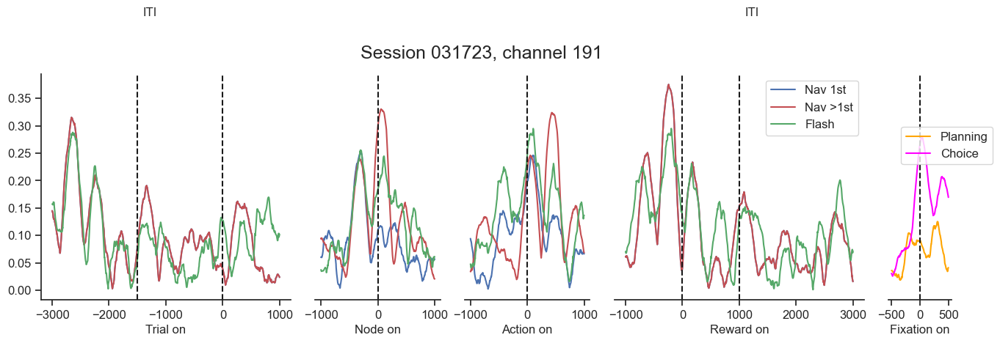

In [86]:
# plot phase alignemnt along a trial

for channel in range(phase_align.shape[0]):
    
    plt.close('all')
    
    xlims = [
        (-3000, 1000),
        (-1000, 1000),
        (-1000, 1000),
        (-1000, 3000),
        (-500,500)
    ]
    
    # Compute width ratios proportional to x-range
    width_ratios = [x2 - x1 for (x1, x2) in xlims]
    
    fig = plt.figure(figsize=(16, 4))
    gs = gridspec.GridSpec(1, 5, figure=fig, width_ratios=width_ratios, wspace=0.15)
    
    axes = []
    for i in range(5):
        if i == 0:
            ax = fig.add_subplot(gs[0, i])            # first panel
        else:
            ax = fig.add_subplot(gs[0, i], sharey=axes[0])  # share y with panel 0
        axes.append(ax)
        
    colors = ['']
    xlabels = ['Trial on', 'Node on', 'Action on', 'Reward on']
    
    
    power_along_trial = get_conditioned_signal('phase',channel,
                                              trial_df.trialerror==0,
                                             (node_df.trialerror==0) & (node_df.step==0),
                                             (action_df.trialerror==0) & (action_df.step==0),
                                             reward_df.trialerror==0)
    
    for ii in range(4):
        timestamps = np.arange(xlims[ii][0],xlims[ii][1])
        axes[ii].plot(timestamps,LFP.compute_phase_alignment(power_along_trial[ii]),color='b',label='Nav 1st')
        axes[ii].set_xlabel(xlabels[ii])
    
    
    
    power_along_trial = get_conditioned_signal('phase',channel,
                                              trial_df.trialerror==0,
                                             (node_df.trialerror==0) & (node_df.step>0),
                                             (action_df.trialerror==0) & (action_df.step>0),
                                             reward_df.trialerror==0)
    for ii in range(4):
        timestamps = np.arange(xlims[ii][0],xlims[ii][1])
        axes[ii].plot(timestamps,LFP.compute_phase_alignment(power_along_trial[ii]),color='r',label='Nav >1st')
        axes[ii].set_xlabel(xlabels[ii])
    
    
    
    power_along_trial = get_conditioned_signal('phase',channel,
                                               trial_df.trialerror==1,
                                             (node_df.trialerror==1) & (node_df.step==0),
                                             (action_df.trialerror==1) & (action_df.step==0),
                                             reward_df.trialerror==1)
    for ii in range(4):
        timestamps = np.arange(xlims[ii][0],xlims[ii][1])
        axes[ii].plot(timestamps,LFP.compute_phase_alignment(power_along_trial[ii]),color='g',label='Flash')
        axes[ii].set_xlabel(xlabels[ii])
        axes[ii].axvline(0,color='k',ls='--')
        if ii==0:
            axes[ii].axvline(-1500,color='k',ls='--')
            axes[ii].text(-1400,0.5,'ITI')
        if ii==3:
            axes[ii].axvline(1000,color='k',ls='--')
            axes[ii].text(1100,0.5,'ITI')  
        if ii>0:
            axes[ii].yaxis.set_visible(False)
            axes[ii].spines['left'].set_visible(False)
    axes[ii].legend()
    
    # fixations
    idx = (fix_df.duration>50) & (fix_df.duration<300) & (fix_df.active_prob<0.2)
    axes[4].plot(np.arange(-500,500),LFP.compute_phase_alignment(fix_aligned['phase'][idx,channel,:]),color='orange',label='Planning')
    
    idx = (fix_df.duration>300) & (fix_df.active_prob>0.8)
    axes[4].plot(np.arange(-500,500),LFP.compute_phase_alignment(fix_aligned['phase'][idx,channel,:]),color='magenta',label='Choice')
    
    axes[4].axvline(0,color='k',ls='--')
    axes[4].set_xlabel('Fixation on')
    axes[4].legend(loc=(0.2,0.6))
    axes[4].yaxis.set_visible(False)
    axes[4].spines['left'].set_visible(False)
    
    plt.suptitle('Session %s, channel %i' % (date,channel))
    plt.savefig('D:/Theta/Session %s, theta phase alignment along a trial, channel %i' % (date,channel),bbox_inches='tight')

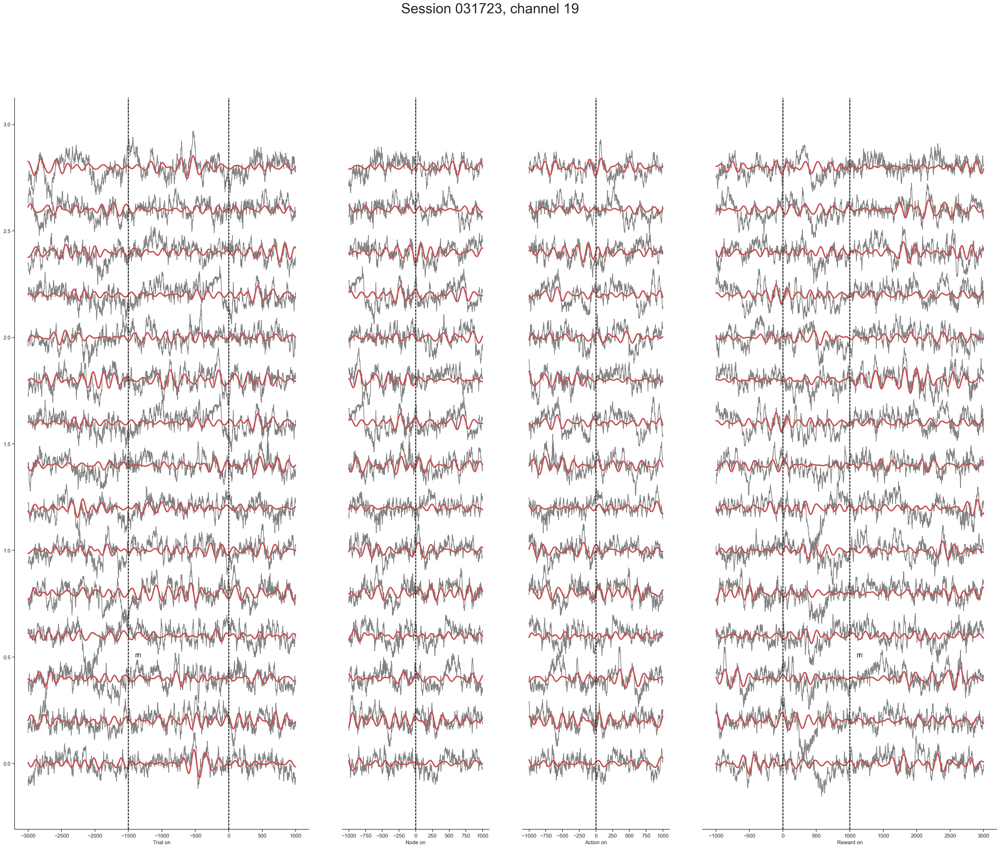

In [133]:
# plot example traces along a trial

channel = 19
# for channel in range(phase_align.shape[0]):

plt.close('all')

xlims = [
    (-3000, 1000),
    (-1000, 1000),
    (-1000, 1000),
    (-1000, 3000)
]

# Compute width ratios proportional to x-range
width_ratios = [x2 - x1 for (x1, x2) in xlims]

fig = plt.figure(figsize=(40, 30))
gs = gridspec.GridSpec(1, 4, figure=fig, width_ratios=width_ratios, wspace=0.15)

axes = []
for i in range(4):
    if i == 0:
        ax = fig.add_subplot(gs[0, i])            # first panel
    else:
        ax = fig.add_subplot(gs[0, i], sharey=axes[0])  # share y with panel 0
    axes.append(ax)
    
colors = ['']
xlabels = ['Trial on', 'Node on', 'Action on', 'Reward on']


LFP_along_trial = get_conditioned_signal('LFP',channel,
                                          trial_df.trialerror==0,
                                         (node_df.trialerror==0) & (node_df.step==0),
                                         (action_df.trialerror==0) & (action_df.step==0),
                                         reward_df.trialerror==0)

band_along_trial = get_conditioned_signal('band',channel,
                                          trial_df.trialerror==0,
                                         (node_df.trialerror==0) & (node_df.step==0),
                                         (action_df.trialerror==0) & (action_df.step==0),
                                         reward_df.trialerror==0)

random_trials = np.random.choice(np.arange(power_along_trial[0].shape[0]),size=15)

for ii in range(4):
    timestamps = np.arange(xlims[ii][0],xlims[ii][1])
    
    for jj, idx in enumerate(random_trials):
        
        axes[ii].plot(timestamps,LFP_along_trial[ii][idx,:]+jj*0.2,color='gray',label='Nav 1st')
        axes[ii].plot(timestamps,band_along_trial[ii][idx,:]+jj*0.2,color='r',label='Nav 1st',lw=3)
        axes[ii].set_xlabel(xlabels[ii])
        axes[ii].axvline(0,color='k',ls='--')
        if ii==0:
            axes[ii].axvline(-1500,color='k',ls='--')
            axes[ii].text(-1400,0.5,'ITI')
        if ii==3:
            axes[ii].axvline(1000,color='k',ls='--')
            axes[ii].text(1100,0.5,'ITI')  
        if ii>0:
            axes[ii].yaxis.set_visible(False)
            axes[ii].spines['left'].set_visible(False)

plt.suptitle('Session %s, channel %i' % (date,channel),fontsize=32)
plt.savefig('D:/Theta/Session %s, individual traces, channel %i' % (date,channel),bbox_inches='tight')

In [14]:
def plot_mean_sem(timestamps,sig,axis,ax,color,label):
    mean = sig.mean(axis=axis)
    sem = sig.std(axis=axis)/np.sqrt(sig.shape[axis])
    ax.plot(timestamps,mean,color=color,label=label)
    ax.fill_between(timestamps,mean-sem,mean+sem,alpha=0.2,color=color)

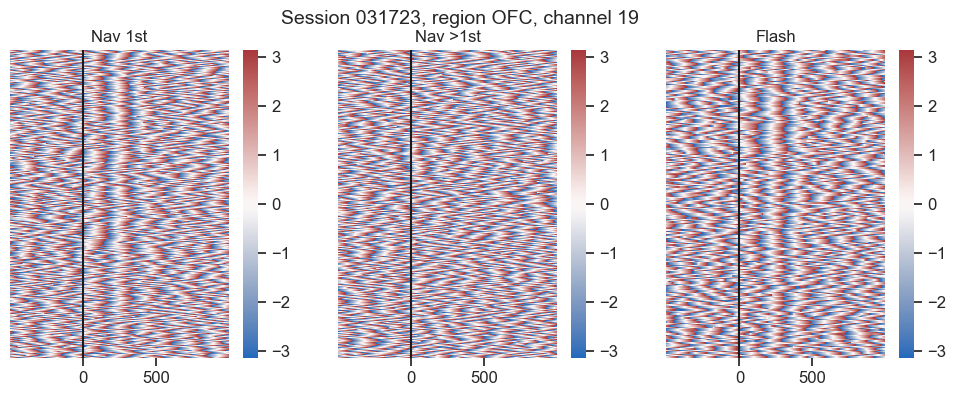

In [126]:
# node on
plt.close('all')
fig, axes = plt.subplots(1,3,figsize=(12,4))

idx = (node_df.step==0) & (node_df.trialerror==0)
sns.heatmap(aligned_phase[idx,OFC_channel,:],cmap='vlag',ax=axes[0])
axes[0].axvline(500,color='k')
axes[0].set_xticks([500,1000])
axes[0].set_xticklabels([0,500],rotation=0)
axes[0].set_yticks([])
axes[0].set_title('Nav 1st')

idx = (node_df.step>0) & (node_df.trialerror==0)
sns.heatmap(aligned_phase[idx,OFC_channel,:],cmap='vlag',ax=axes[1])
axes[1].axvline(500,color='k')
axes[1].set_xticks([500,1000])
axes[1].set_xticklabels([0,500],rotation=0)
axes[1].set_yticks([])
axes[1].set_title('Nav >1st')

idx = (node_df.step==0) & (node_df.trialerror==1)
sns.heatmap(aligned_phase[idx,OFC_channel,:],cmap='vlag',ax=axes[2])
axes[2].axvline(500,color='k')
axes[2].set_xticks([500,1000])
axes[2].set_xticklabels([0,500],rotation=0)
axes[2].set_yticks([])
axes[2].set_title('Flash')

plt.suptitle(f"Session {date}, region OFC, channel {channel}",fontsize=14)
plt.savefig(f"D:/Theta/Phase trail by trial, Session {date}, region OFC, channel {channel}")

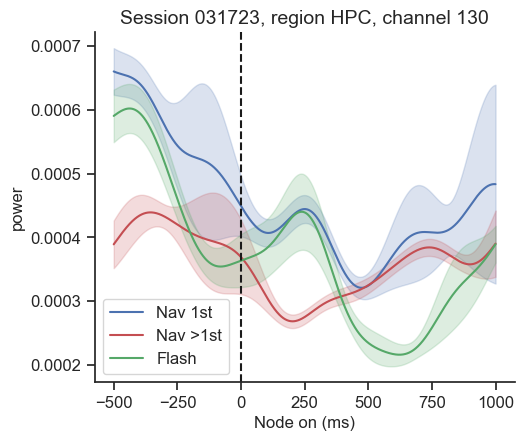

In [74]:
plt.close('all')
fig, axes = plt.subplots(figsize=(6,5))

channel = HPC_channel

idx = (node_df.step==0) & (node_df.trialerror==0)
plot_mean_sem(np.arange(-500,1000),aligned_power[idx,channel,:],0,axes,'b','Nav 1st')

idx = (node_df.step>0) & (node_df.trialerror==0)
plot_mean_sem(np.arange(-500,1000),aligned_power[idx,channel,:],0,axes,'r','Nav >1st')

idx = (node_df.step==0) & (node_df.trialerror==1)
plot_mean_sem(np.arange(-500,1000),aligned_power[idx,channel,:],0,axes,'g','Flash')

plt.ylabel('power')
plt.axvline(0,color='k',ls='--')
plt.xlabel('Node on (ms)')
plt.title(f"Session {date}, region HPC, channel {channel}",fontsize=14)
plt.legend()
axes.set_position([0.2,0.15,0.7,0.7])
plt.savefig(f"D:/Theta/Power, Session {date}, region HPC, channel {channel}")

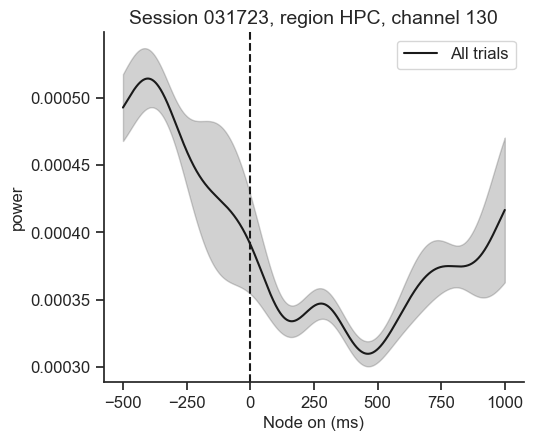

In [75]:
plt.close('all')
fig, axes = plt.subplots(figsize=(6,5))

channel = HPC_channel

plot_mean_sem(np.arange(-500,1000),aligned_power[:,channel,:],0,axes,'k','All trials')

plt.ylabel('power')
plt.axvline(0,color='k',ls='--')
plt.xlabel('Node on (ms)')
plt.title(f"Session {date}, region HPC, channel {channel}",fontsize=14)
plt.legend()
axes.set_position([0.2,0.15,0.7,0.7])
plt.savefig(f"D:/Theta/Power, all trials, Session {date}, region HPC, channel {channel}")

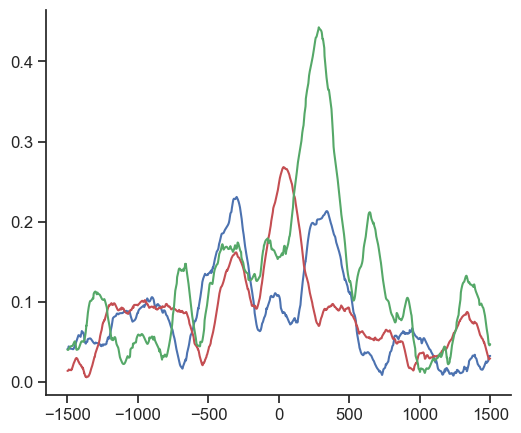

In [77]:
plt.close('all')
fig, axes = plt.subplots(figsize=(6,5))

channel = HPC_channel

plt.plot(np.arange(-1500,1500),phase_align[channel,0,:],color='b',label='Nav 1st')
plt.plot(np.arange(-1500,1500),phase_align[channel,1,:],color='r',label='Nav >1st')
plt.plot(np.arange(-1500,1500),phase_align[channel,2,:],color='g',label='Flash')

# plt.xlim(-500,1000)

# plt.ylabel('Alignment')
# plt.axvline(0,color='k',ls='--')
# plt.xlabel('Node on (ms)')
# plt.title(f"Session {date}, region HPC, channel {channel}",fontsize=14)
# plt.legend()
# axes.set_position([0.2,0.15,0.7,0.7])
# plt.savefig(f"D:/Theta/Phase alignment, Session {date}, region HPC, channel {channel}")

In [13]:
def get_probe_region_channel(nwbfile,region):
    
    unitNames = nwbfile.units.to_dataframe()
    probes = unitNames.query('region==@region').drop_duplicates('probe')

    return probes

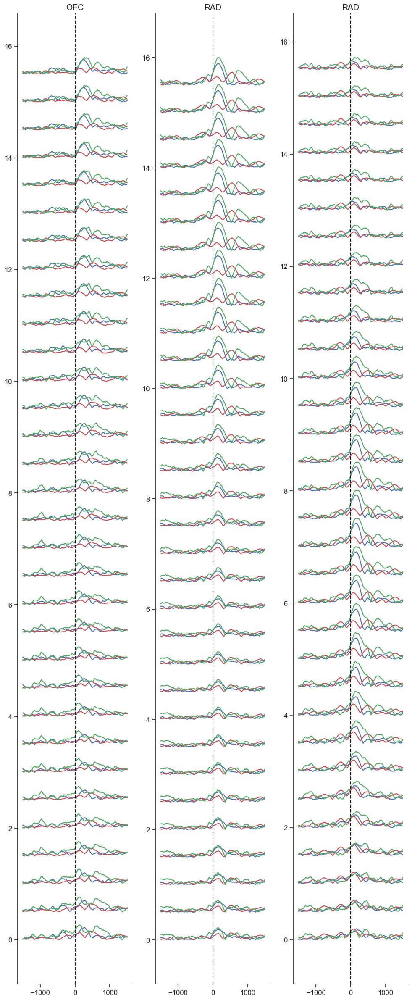

In [128]:
for date in ['031723','032023','032823','033123','040423','040723']:
    
    phase_align = np.load('D:/Theta/Session %s, theta phase alignment.npz' % date)['arr_0']
    nwbfile = load_data.load_nwbfile('Bart',date) 
    
    window = [-1500,1500]
    plt.close('all')
    fig, axes = plt.subplots(1,3,figsize=(12,30))
    plot_probe_channel('HPC', phase_align[:,0,:], np.arange(window[0],window[1]),'b', 0.5)
    plot_probe_channel('HPC', phase_align[:,1,:], np.arange(window[0],window[1]),'r', 0.5)
    plot_probe_channel('HPC', phase_align[:,2,:], np.arange(window[0],window[1]),'g', 0.5)
    axes[0].axvline(0,color='k',ls='--')
    axes[1].axvline(0,color='k',ls='--')
    axes[2].axvline(0,color='k',ls='--')
    plt.savefig('D:/Theta/HPC Phase alignement session %s' % date)

In [22]:
def plot_probe_channel(region, data, timestamps, color, scale):
    
    probes = get_probe_region_channel(nwbfile,region)
    
    for ii, p in enumerate(probes.probe.unique()):
    
        sub_df = probes.query('probe==@p')
        probe_channels = np.arange(sub_df.start_channel.min()-1, sub_df.end_channel.max())
    
        axes[ii].set_title(sub_df.subfield.values[0],fontsize=14)
        
        for jj, ch in enumerate(probe_channels):
            axes[ii].plot(timestamps,data[ch,:]+scale*jj,color=color)


In [53]:
timestamps, lfpData = load_data.load_LFP(date)

In [95]:
cand_trials = node_df.query("trialerror==1").trial.values

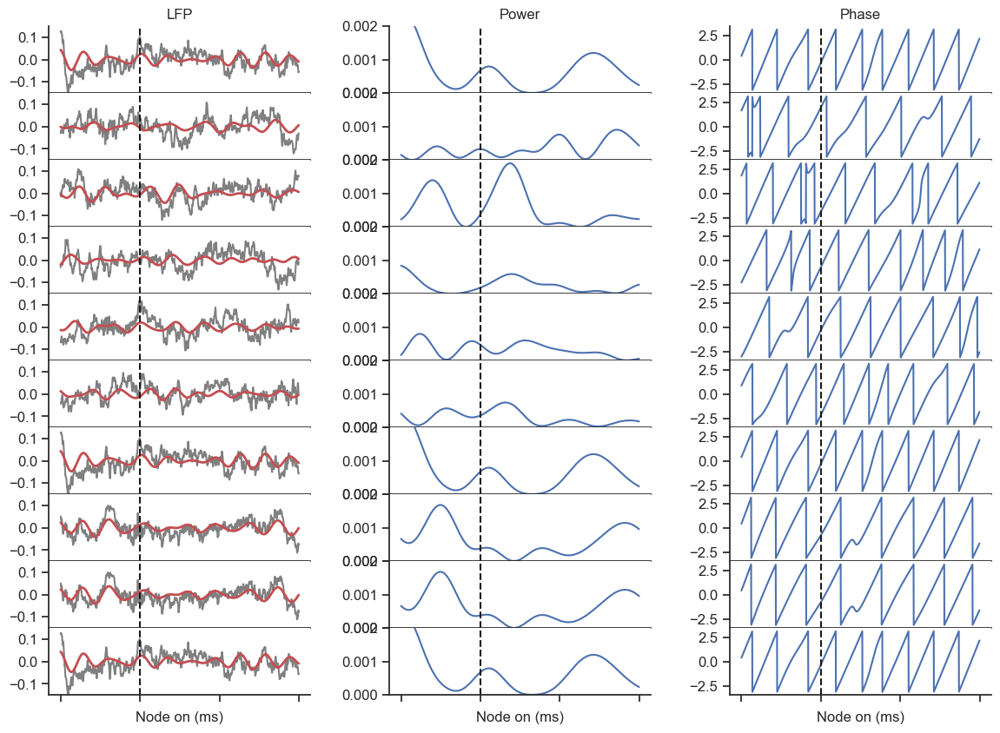

In [137]:
channel = 19
aligned_ts = np.arange(-500,1000)

plt.close('all')
fig, axes = plt.subplots(
    10, 3, figsize=(14, 10),
    sharex=True,
    sharey=False,
    gridspec_kw=dict(hspace=0, wspace=0.3)   # <-- remove vertical space
)


for ii, trial in enumerate(np.random.choice(random_trials,size=10)):

    start_time = int(node_df.query('(trial==@trial)&(step==0)').t_on.values[0])
    timestamps = np.arange(start_time-500, start_time+1000)

    ds = ThetaDataset("D:/Theta/Session_%s_theta.h5" % date)
    band_sig, power, phase = ds.get_trace(timestamps)
    ds.close()
    
    # --- 1. Raw LFP ---
    axes[ii, 0].plot(aligned_ts, lfpData[timestamps, :][:, channel], color='gray')
    axes[ii, 0].plot(aligned_ts, band_sig[channel, :], color='r',lw=2)
    axes[ii, 0].axvline(0, color='k', ls='--')
    axes[ii, 0].set_xlabel("Node on (ms)")  # this will stay only for bottom row later
    axes[ii, 0].set_ylim(-0.15,0.15)
    
    # --- 2. Power ---
    axes[ii, 1].plot(aligned_ts, power[channel, :])
    axes[ii, 1].axvline(0, color='k', ls='--')
    axes[ii, 1].set_xlabel("Node on (ms)")  # this will stay only for bottom row later
    axes[ii, 1].set_ylim(0,0.002)

    # --- 3. Phase ---
    axes[ii, 2].plot(aligned_ts, phase[channel, :])
    axes[ii, 2].axvline(0, color='k', ls='--')
    axes[ii, 2].set_xlabel("Node on (ms)")  # this will stay only for bottom row later

axes[0, 0].set_title("LFP")
axes[0, 1].set_title("Power")
axes[0, 2].set_title("Phase")

# Hide x-axis for all rows *except the last*
for ax_row in axes[:-1]:
    for ax in ax_row:
        ax.set_xticklabels([])
        ax.set_xlabel(None)
        # ax.set_yticklabels([])
        # ax.set_ylabel(None)


plt.savefig('D:/Theta/Session %s, channel %i, individual traces node on'%(date,channel))

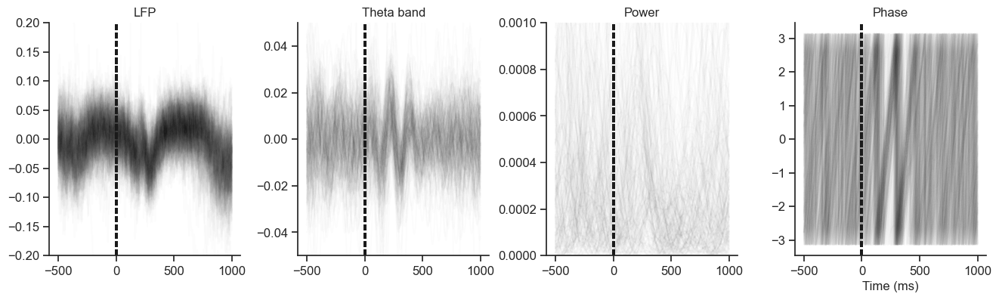

In [125]:
channel = OFC_channel
aligned_ts = np.arange(-500,1000)

plt.close('all')
fig, axes = plt.subplots(
    1, 4, figsize=(16, 4),
    sharex=True,
    sharey=False,
    gridspec_kw=dict(hspace=0, wspace=0.3)   # <-- remove vertical space
)

for ii, trial in enumerate(cand_trials):

    start_time = int(node_df.query('trial==@trial').t_on.values[0])
    timestamps = np.arange(start_time-500, start_time+1000)

    ds = ThetaDataset("D:/Theta/Session_%s_theta.h5" % date)
    band_sig, power, phase = ds.get_trace(timestamps)
    ds.close()
    
    # --- 1. Raw LFP ---
    axes[0].plot(aligned_ts, lfpData[timestamps, :][:, channel], color='k',alpha=0.01)
    # axes[0, 0].plot(aligned_ts, band_sig[channel, :], color='k',alpha=0.01)
    axes[0].axvline(0, color='k', ls='--')
    axes[0].set_ylim(-0.2,0.2)

    axes[1].plot(aligned_ts, band_sig[channel, :], color='k',alpha=0.01)
    axes[1].axvline(0, color='k', ls='--')
    axes[1].set_ylim(-0.05,0.05)
    
    # --- 2. Power ---
    axes[2].plot(aligned_ts, power[channel, :], color='k',alpha=0.01)
    axes[2].axvline(0, color='k', ls='--')
    axes[2].set_ylim(0,0.001)

    # --- 3. Phase ---
    axes[3].plot(aligned_ts, phase[channel, :], color='k',alpha=0.01)
    axes[3].axvline(0, color='k', ls='--')
    axes[3].set_xlabel("Time (ms)")  # this will stay only for bottom row later

axes[0].set_title("LFP")
axes[1].set_title("Theta band")
axes[2].set_title("Power")
axes[3].set_title("Phase")

plt.savefig('D:/Theta/overlay traces')

In [303]:
psd = np.zeros((aligned_lfp.shape[0],501))
ch = 0
fs = 1000
for trial in range(aligned_lfp.shape[0]):
    ofc_signal = preprocess_LFP(aligned_lfp[trial,ch,:])
    freqs, psd[trial,:] = signal.welch(ofc_signal,fs=fs,nperseg=fs)

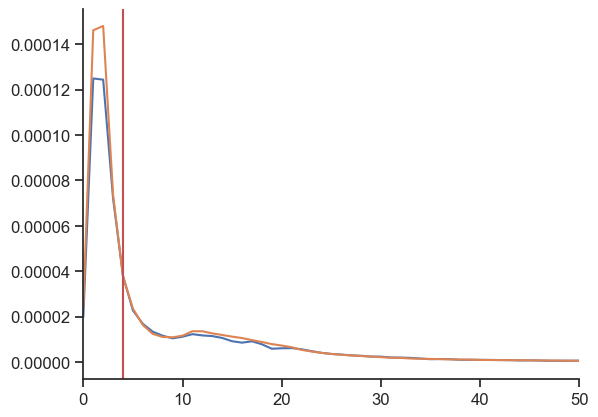

In [305]:
plt.close('all')
plt.plot(psd[:96,:].mean(axis=0))
plt.plot(psd[96:,:].mean(axis=0))
plt.xlim(0,50)
plt.axvline(4,color='r')

In [ ]:
psd = np.zeros((192,501))
trial = 0
for ch in tqdm(range(192)):
    ofc_signal = preprocess_LFP(aligned_lfp[trial,ch,:])
    freqs, psd[ch,:] = signal.welch(ofc_signal,fs=fs,nperseg=fs)

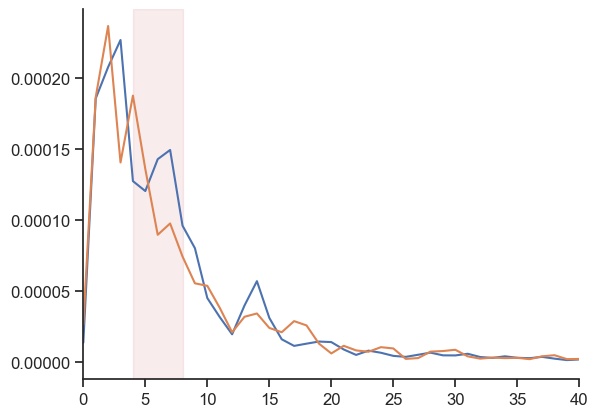

In [36]:
plt.close('all')
fs=1000
trial=7
f, psd = signal.welch(aligned_lfp[trial,ch,:],fs=fs,nperseg=fs)
plt.plot(f,psd)
f, psd = signal.welch(ofc_signal,fs=fs,nperseg=fs)
plt.plot(f,psd)
plt.xlim(0,40)
plt.axvline(60)
plt.axvspan(4,8,color='r',alpha=0.1)

In [18]:
def preprocess_LFP(lfp, fs=1000):
    
    # notch filter, remove 60Hz and harmonics
    
    preprocessed = lfp.copy()
    
    for f0 in [60, 120, 180, 240]:# design 10th order band-stop (Butterworth) filter for each noise frequency +/- 2 Hz
        # notchfilt = butter(order, (f0-2,f0+2), 'bandstop', fs=fs, output='sos')
        # preprocessed = sosfiltfilt(notchfilt, preprocessed)
        b, a = signal.iirnotch(f0,f0/2,fs)
        sos = signal.tf2sos(b,a)
        preprocessed = sosfiltfilt(sos, preprocessed)
    
    return preprocessed

In [6]:
def freq_band(preprocessed, band, order=6, fs=1000):

    # 1. bandpass, ripple band 150-250 (rat), NHP band 80-180
    
    sos = butter(order, band, btype='bandpass', output='sos', fs=fs)
    band_sig = sosfiltfilt(sos, preprocessed)

    
    # 2. calculate the power and phase of this frequency band

    hilb_sig = hilbert(band_sig)
    power = np.abs(hilb_sig)
    phase = np.angle(hilb_sig)


    return band_sig, power, phase

In [7]:
def compute_phase_alignment(phase):

    phase_alignment = np.zeros(phase.shape[1])
    
    for tt in range(phase.shape[1]):
        phase_alignment[tt] = np.abs(np.sum(np.exp(1j*phase[:,tt])))/phase.shape[0]

    return phase_alignment

In [8]:
def epoch_aligned_lfp(date,epoch,query,window):
    
    # load behavior
    nwbfile = import_behavior(date)
    timestamps, lfpData = import_LFP(date)
    df = nwbfile.intervals[epoch].to_dataframe().query(query)

    num_ch = lfpData.shape[1]
    aligned_lfp = np.zeros((len(df),num_ch,window[1]-window[0]))  # 1 if happened during ITI, 0 if during a trial
    
    for ii in range(len(df)):
    
        on = df.iloc[ii].start_time
        idx = (timestamps>on+window[0]) & (timestamps<on+window[1])
        aligned_lfp[ii,:,:]=lfpData[idx,:].T.astype(np.float32)
    
    return aligned_lfp

In [9]:
def epoch_aligned_band(date,epoch,query,theta,window=[-500,2000]):
    
    # load behavior
    nwbfile = import_behavior(date)
    timestamps, lfpData = import_LFP(date)                                                                                               
    df = nwbfile.intervals[epoch].to_dataframe()
    if epoch!='trials':
        df['istarget'] = df['node']==df['target']
        df = df.query(query)

    aligned_phase = np.zeros((lfpData.shape[1],len(df),window[1]-window[0]))
    aligned_power = np.zeros((lfpData.shape[1],len(df),window[1]-window[0]))

    # band_sig = theta['arr_0'][:,channel]
    power = theta['arr_1']
    phase = theta['arr_2']
    
    for ii in range(len(df)):
    
        on = df.iloc[ii].start_time
        idx = (timestamps>on+window[0]) & (timestamps<on+window[1])
        aligned_phase[:,ii,:]=phase[idx,:].T.astype(np.float32)
        aligned_power[:,ii,:]=power[idx,:].T.astype(np.float32)
    
    return aligned_phase, aligned_power

In [ ]:
# calculate theta phase alignment for all sessions in Bart

window = [-1000,2000]
for date in ['032823','033123','032023','040423','040723']:
    
    theta = np.load('Session %s, theta.npz' % date)
    _, lfpData = import_LFP(date)
    num_ch = lfpData.shape[1]
    phase_alignment = np.zeros((num_ch,3,window[1]-window[0]))
    
    for ch in tqdm(range(num_ch)):
        
        aligned_phase, aligned_power = epoch_aligned_band(date,'node_on','(trialerror==0)&(step==0)',theta,ch,window=window)
        phase_alignment[ch,0,:] = compute_phase_alignment(aligned_phase)
        
        aligned_phase, aligned_power = epoch_aligned_band(date,'node_on','(trialerror==0)&(step>0)',theta,ch,window=window)
        phase_alignment[ch,1,:] = compute_phase_alignment(aligned_phase) 
        
        aligned_phase, aligned_power = epoch_aligned_band(date,'node_on','trialerror==1',theta,ch,window=window)
        phase_alignment[ch,2,:] = compute_phase_alignment(aligned_phase)

    np.savez('Session %s, theta phase alignment.npz' % date, phase_alignment)

In [187]:
def pick_channel_on_phase(date, candidate_channels, aligned_phase=[], visualize=0):
    
    phase_alignment = np.load('Session %s, theta phase alignment 2.npz' % date)['arr_0']
    linear_index = np.argmax(phase_alignment[candidate_channels,:,:])
    ch_idx, _, _ = np.unravel_index(linear_index, phase_alignment.shape)
    channel = candidate_channels[ch_idx]

    if visualize:
        plt.close('all')
        sns.heatmap(aligned_phase[channel,:,:],cmap='vlag')
        plt.axvline(1500)
    
    return channel

In [ ]:
# get band power and phase in a session
date = '031723'
theta = np.load('Session %s, theta.npz' % date)
window = [-1000,2000]
aligned_phase, aligned_power = epoch_aligned_band(date,'node_on','(trialerror==0)&(step==0)', theta, window=window)

In [ ]:
from fooof import FOOOFGroup
fg = FOOOFGroup()
fg.fit(freqs, psd, [2, 50])
fm = fg.get_fooof(ind=4, regenerate=True)
fm.print_results()
fm.plot()

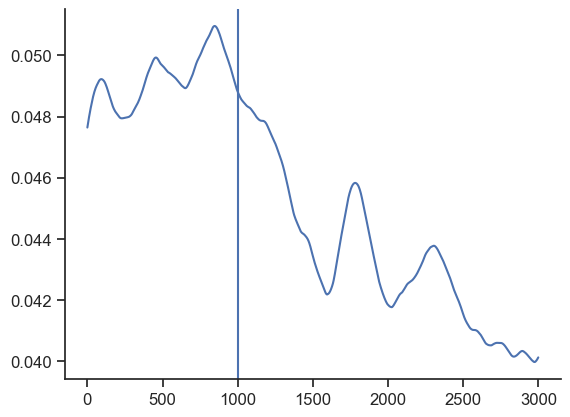

In [182]:
plt.close('all')
# sns.heatmap(aligned_phase[127,:,:])
plt.plot(aligned_power[127,:,:].mean(axis=0))
plt.axvline(1000)

In [ ]:
def pick_channel_on_power(aligned_power):

np.int64(19)

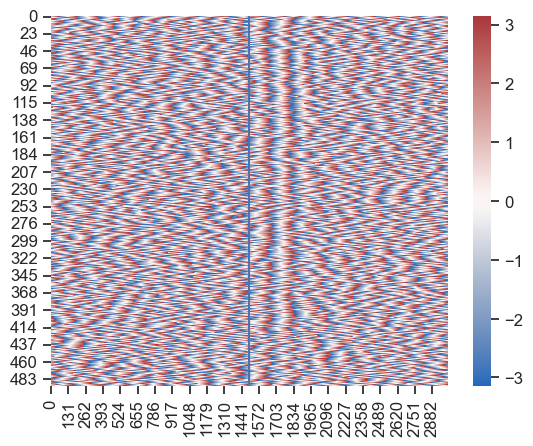

In [188]:
channel = pick_channel_on_phase('031723', np.arange(96),visualize=1,aligned_phase=aligned_phase)
channel

np.int64(96)

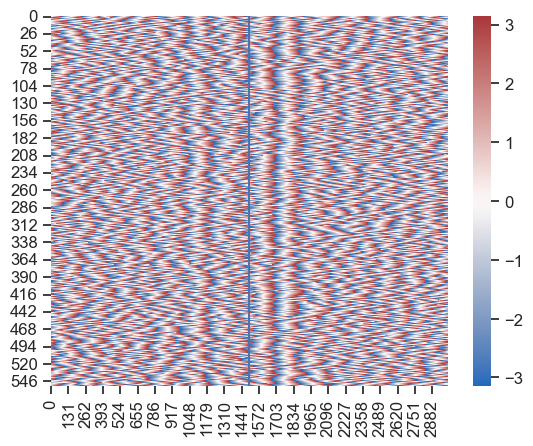

In [191]:
# get band power and phase in a session
# date = '032823'
# theta = np.load('Session %s, theta.npz' % date)
# window = [-1000,2000]
# aligned_phase_0328, aligned_power_0328 = epoch_aligned_band(date,'node_on','(trialerror==0)&(step==0)', theta, window=window)

hpc_channel = pick_channel_on_phase(date, np.arange(96,192),visualize=1,aligned_phase=aligned_phase_0328)
hpc_channel

In [231]:
fix_df = nwbfile.intervals['fixations'].to_dataframe()

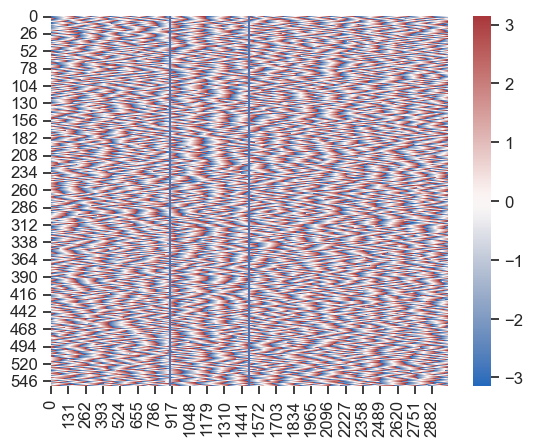

In [227]:
# get band power and phase in a session
# date = '032823'
# theta = np.load('Session %s, theta.npz' % date)
# window = [-1000,2000]
# aligned_phase_0328_reward, aligned_power_0328_reward = epoch_aligned_band(date,'reward_on','(trialerror==0)', theta, window=window)

hpc_channel = pick_channel_on_phase(date, np.arange(96,192),visualize=1,aligned_phase=aligned_phase_0328_reward)
hpc_channel
plt.axvline(1500-600)

np.int64(96)

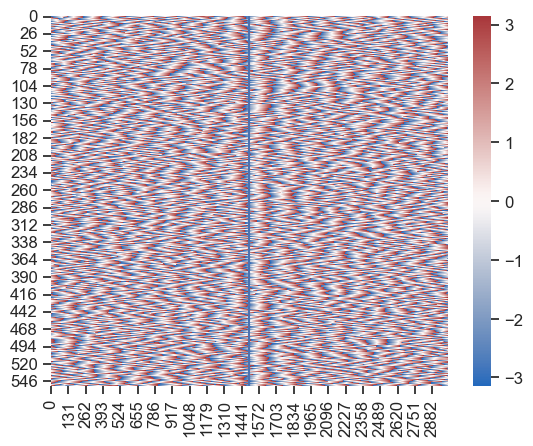

In [241]:
# get band power and phase in a session
# date = '032823'
# theta = np.load('Session %s, theta.npz' % date)
# window = [-1000,2000]
aligned_phase_0328_node, aligned_power_0328_node = epoch_aligned_band(date,'action_on','(trialerror==0) & (step==0)', theta, window=window)

hpc_channel = pick_channel_on_phase(date, np.arange(96,192),visualize=1,aligned_phase=aligned_phase_0328_node)
hpc_channel
# plt.axvline(1500-600)

np.int64(48)

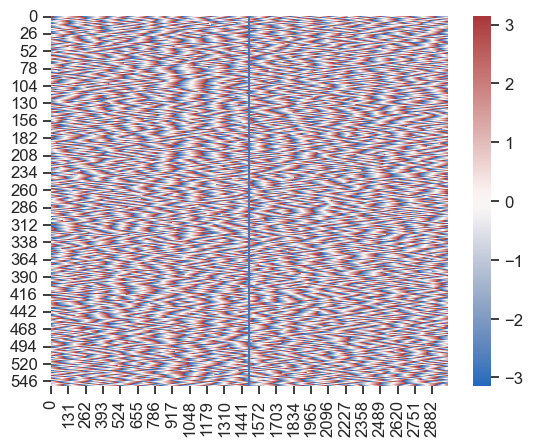

In [208]:
ofc_channel = pick_channel_on_phase(date, np.arange(96),visualize=1,aligned_phase=aligned_phase_0328_reward)
ofc_channel

In [197]:
phase_alignment = np.load('Session %s, theta phase alignment 2.npz' % date)['arr_0']

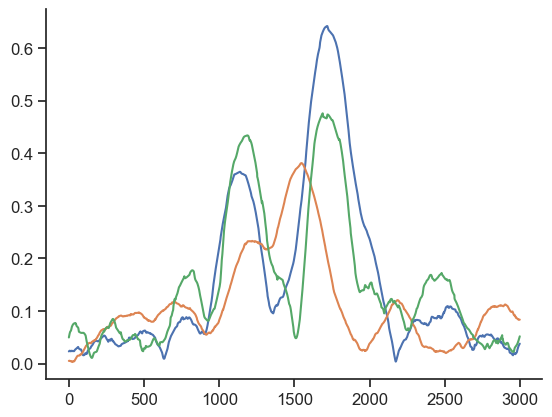

In [206]:
plt.close('all')
# ii = 2
plt.plot(phase_alignment[hpc_channel,:,:].T)
# plt.plot(phase_alignment[ofc_channel,ii,:])

np.int64(48)

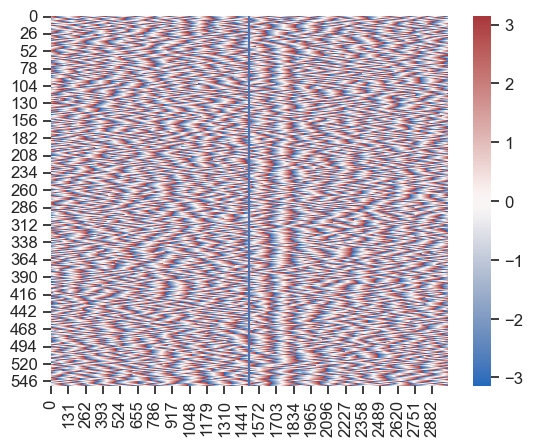

In [192]:
# get band power and phase in a session
# date = '032823'
# theta = np.load('Session %s, theta.npz' % date)
# window = [-1000,2000]
# aligned_phase_0328, aligned_power_0328 = epoch_aligned_band(date,'node_on','(trialerror==0)&(step==0)', theta, window=window)

ofc_channel = pick_channel_on_phase(date, np.arange(96),visualize=1,aligned_phase=aligned_phase_0328)
ofc_channel

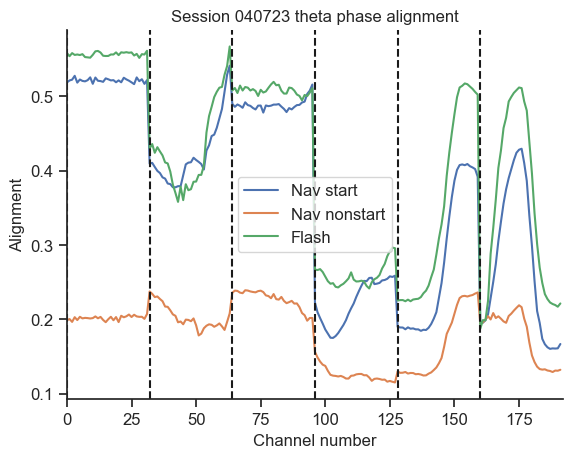

In [161]:
# look at phase alignment across channels

for date in ['031723','032823','033123','032023','040423','040723']:
    
    phase_alignment = np.load('Session %s, theta phase alignment 2.npz' % date)['arr_0']
    
    plt.close('all')
    for ii in range(3):
        plt.plot(phase_alignment[:,ii,:].max(axis=1),label=labels[ii])
    for pp in range(int(phase_alignment.shape[0]/32)):
        plt.axvline(32*pp,color='k',ls='--')

    plt.legend()
    plt.xlabel('Channel number')
    plt.ylabel('Alignment')
    plt.xlim(0,192)
    plt.title('Session %s theta phase alignment' % date)
    plt.savefig('Session %s theta phase alignment' % date)

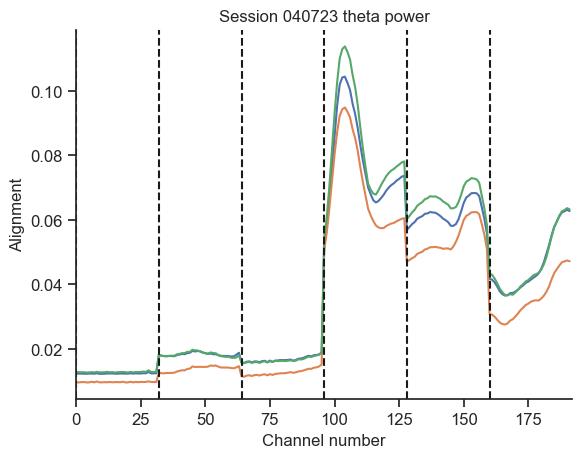

In [172]:
# look at power across channels

window = [-1000,2000]
querys = ['(trialerror==0)&(step==0)','(trialerror==0)&(step>0)','trialerror==1']

for date in ['032823','033123','032023','040423','040723']:
    
    theta = np.load('Session %s, theta.npz' % date)
    
    plt.close('all')
    
    for ii in range(3):
        _, aligned_power = epoch_aligned_band(date,'node_on',querys[ii], theta, window=window)
        plt.plot(aligned_power.mean(axis=1).max(axis=1),label=labels[ii])
        
    for pp in range(int(phase_alignment.shape[0]/32)):
        plt.axvline(32*pp,color='k',ls='--')
    
    plt.xlabel('Channel number')
    plt.ylabel('Alignment')
    plt.xlim(0,192)
    plt.title('Session %s theta power' % date)
    plt.savefig('Session %s theta power' % date)

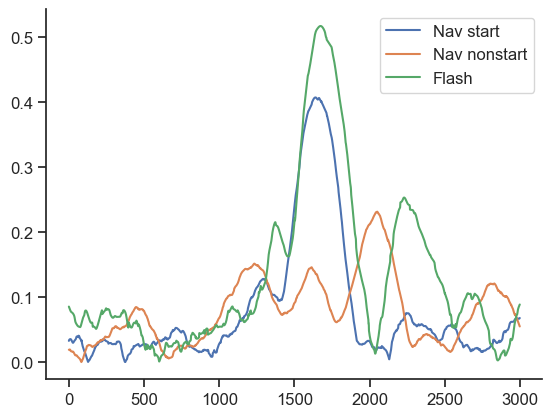

In [151]:
plt.close('all')
labels = ['Nav start','Nav nonstart','Flash']
for ii in range(3):
    plt.plot(phase_alignment[channel,ii,:],label=labels[ii])
plt.legend()

In [75]:
lfpFile = h5py.File('D:/Teleworld/bart_I/raw/spikes/Bart_TeleWorld_v13_%s-spikes.mat' % date, 'r')
eventTable = np.array(lfpFile['/eventTable'])

In [82]:
for date in ['032823','033123','032023','040423','040723']:
    nonstart = np.load('Session %s, theta phase alignment nonstart.npz' % date)['arr_0']
    start = np.load('Session %s, theta phase alignment.npz' % date)['arr_0']
    start[:,1,:]=nonstart[:,1,:]
    np.savez('Session %s, theta phase alignment 2.npz' % date, start)

In [140]:
# date='031723'
# DATA_DIR = 'D:\\'
# os.chdir(DATA_DIR)
# theta = np.load('Session %s, theta.npz' % date)
aligned_phase, aligned_power = epoch_aligned_band(date,'node_on','trialerror==0',theta)

In [153]:
ofc = aligned_power.mean(axis=(1,2))[:96]
hpc = aligned_power.mean(axis=(1,2))[96:]

In [160]:
aligned_phase[np.argmax(ofc),0,:].shape

(2500,)

In [156]:
f, Cxy = signal.coherence(x, y, fs, nperseg=1024)

np.int64(31)

Text(0, 0.5, 'Power')

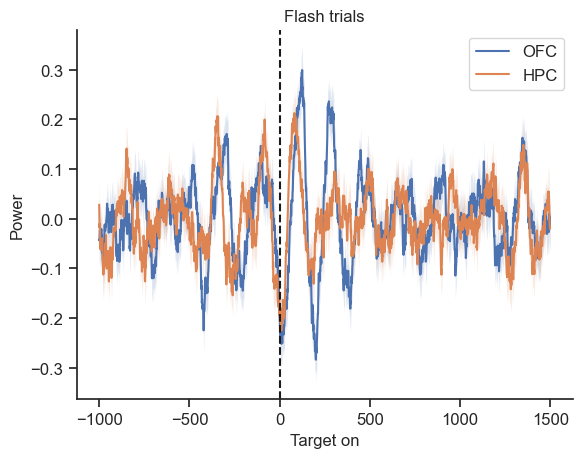

In [158]:
plt.close('all')

timestamps = np.arange(-1000,1500)

signal = aligned_phase[np.argmax(ofc),:,:]
mean = signal.mean(axis=0)
sem = signal.std(axis=0)/np.sqrt(signal.shape[0])
plt.plot(timestamps,mean, label='OFC')
plt.fill_between(timestamps,mean-sem,mean+sem,alpha=0.2)

signal = aligned_phase[96+np.argmax(hpc),:,:]
mean = signal.mean(axis=0)
sem = signal.std(axis=0)/np.sqrt(signal.shape[0])
plt.plot(timestamps,mean, label='HPC')
plt.fill_between(timestamps,mean-sem,mean+sem,alpha=0.2)

plt.axvline(0,color='k',ls='--')

plt.title('Flash trials')
plt.legend()
# plt.ylim(0,0.5)

plt.xlabel('Target on')
plt.ylabel('Power')
# plt.savefig('Flash phase alignement start trials')

In [125]:
window = [-1000,2000]
for date in ['032823','033123','032023','040423','040723']:
    
    theta = np.load('Session %s, theta.npz' % date)
    _, lfpData = import_LFP(date)
    num_ch = lfpData.shape[1]
    phase_alignment = np.zeros((num_ch,3,window[1]-window[0]))
    
    for ch in tqdm(range(num_ch)):
        
        # aligned_phase, aligned_power = epoch_aligned_band(date,'node_on','(trialerror==0)&(step==0)',theta,ch,window=window)
        # phase_alignment[ch,0,:] = compute_phase_alignment(aligned_phase)
        
        aligned_phase, aligned_power = epoch_aligned_band(date,'node_on','(trialerror==0)&(step>0)',theta,ch,window=window)
        phase_alignment[ch,1,:] = compute_phase_alignment(aligned_phase) 
        
        # aligned_phase, aligned_power = epoch_aligned_band(date,'node_on','trialerror==1',theta,ch,window=window)
        # phase_alignment[ch,2,:] = compute_phase_alignment(aligned_phase)

    np.savez('Session %s, theta phase alignment nonstart.npz' % date, phase_alignment)

100%|██████████| 192/192 [1:11:09<00:00, 22.24s/it]


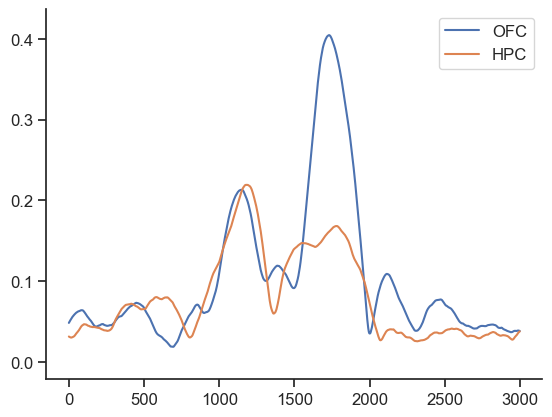

In [123]:
phase_align = np.load('Session 031723, theta phase alignment.npz')['arr_0']
plt.close('all')

timestamps = np.arange(-1500,1500)

signal = phase_align[:96,0,:]
mean = signal.mean(axis=0)
sem = signal.std(axis=0)/np.sqrt(signal.shape[0])
plt.plot(timestamps,mean, label='OFC')
plt.fill_between(timestamps,mean-sem,mean+sem)

signal = phase_align[96:,0,:]
mean = signal.mean(axis=0)
sem = signal.std(axis=0)/np.sqrt(signal.shape[0])
plt.plot(timestamps,mean, label='HPC')
plt.fill_between(timestamps,mean-sem,mean+sem)

plt.title('Navigation trials')
plt.legend()

plt.xlabel('Start node on')

In [39]:
for date in ['031723','032823','033123','032023','040423','040723']:
    
    timestamps, lfpData = import_LFP(date)
    
    num_ch = lfpData.shape[1]
    band_sig = np.zeros((lfpData.shape[0],num_ch))
    power = np.zeros((lfpData.shape[0],num_ch))
    phase = np.zeros((lfpData.shape[0],num_ch))
    
    for ch in tqdm(range(num_ch)):
        
        ch_lfp = lfpData[:,ch]
        preprocessed = preprocess_LFP(ch_lfp)
        band_sig[:,ch], power[:,ch], phase[:,ch] = freq_band(preprocessed, [4,8])
    
    np.savez('Session %s, theta' % date, band_sig, power, phase)

100%|██████████| 192/192 [1:51:17<00:00, 34.78s/it]


In [26]:
aligned_lfp = epoch_aligned_lfp('031723','node_on','trialerror<2',[-500,2000])

In [ ]:
coefficients, freqs, power = do_wavelet(lfp[ii,:])
zscored_power = (power-power.mean(axis=1)[:, None])/power.std(axis=1)[:, None]

In [ ]:
def do_wavelet(sig, fs=1000):

    # notch filter 60hz and harmonics
    
    lfp_filt = sig.copy()
    for f0 in [60, 120, 180, 240]:# design 10th order band-stop (Butterworth) filter for each noise frequency +/- 2 Hz
        notchfilt = butter(10, (f0-2,f0+2), 'bandstop', fs=1000, output='sos')
        lfp_filt = sosfiltfilt(notchfilt, lfp_filt)

    t = np.arange(lfp.shape[1])
    p = np.polyfit(t, lfp_filt, deg=3)  # cubic fit
    trend = np.polyval(p, t)
    detrended = lfp_filt - trend

    
    # Define frequencies of interest (1 to 100 Hz, logarithmically spaced)
    freqs = np.logspace(np.log10(1), np.log10(250), num=40)
    
    # Convert frequencies to scales for Morlet wavelet in pywt
    # The formula depends on the wavelet center frequency:
    wavelet = 'cmor1.5-1.0'  # complex Morlet with bandwidth=1.5, center freq=1.0
    center_freq = pywt.central_frequency(wavelet)
    scales = center_freq * fs / freqs
    

    # Compute the Continuous Wavelet Transform (CWT)
    coefficients, frequencies = pywt.cwt(detrended, scales, wavelet, sampling_period=1/fs)
    
    # Compute power (magnitude squared of coefficients)
    power = np.abs(coefficients) ** 2

    return coefficients, frequencies, power

In [23]:
# Convert frequencies to scales for Morlet wavelet in pywt
# The formula depends on the wavelet center frequency:
freqs = np.logspace(np.log10(1), np.log10(2), num=40)
fs = 1000/4

wavelet = 'cmor1.5-1.0'  # complex Morlet with bandwidth=1.5, center freq=1.0
center_freq = pywt.central_frequency(wavelet)
scales = center_freq * fs / freqs

# Compute the Continuous Wavelet Transform (CWT)
coefficients, frequencies = pywt.cwt(y, scales, wavelet, sampling_period=1/fs)

# Compute power (magnitude squared of coefficients)
power = np.abs(coefficients) ** 2

In [39]:
a = hilbert(y)

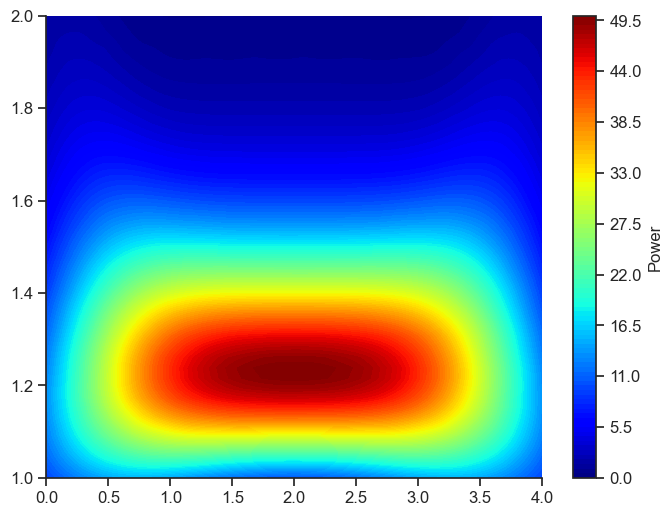

In [35]:
plt.close('all')
plt.figure(figsize=(8, 6))
plt.contourf(np.linspace(0,4,1000), freqs, power, 100, cmap='jet')
# plt.yscale('log')
# plt.ylim(20,80)
plt.colorbar(label='Power')
# plt.ylim(150,250)
# plt.axhline(80,color='w')
# plt.axhline(180,color='w')
# plt.xlim(-200,200)

In [260]:
phase = np.zeros((len(df),3000))
power = np.zeros((len(df),3000))
band_sig = np.zeros((len(df),3000))

for tt in range(len(df)):
    pp_lfp = preprocess_LFP(aligned_lfp[tt,0,:])
    band_sig[tt,:], power[tt,:], phase[tt,:] = freq_band(pp_lfp, [4,8])

In [266]:
idx = df.step.values==0

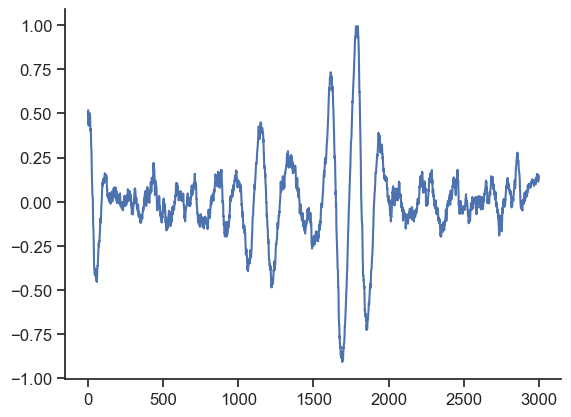

In [251]:
plt.close('all')
plt.plot(phase[idx,:].mean(axis=0))

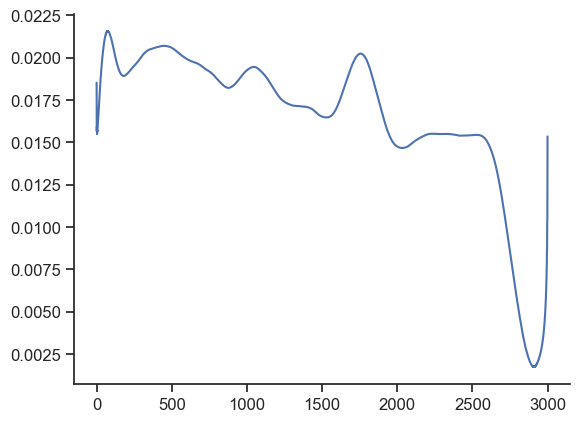

In [253]:
plt.close('all')
plt.plot(power[idx,:].mean(axis=0))

(1000.0, 2500.0)

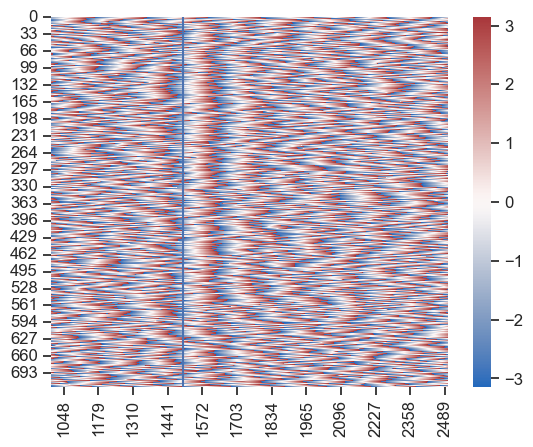

In [276]:
plt.close('all')
sns.heatmap(phase[idx,:],cmap='vlag')
plt.axvline(1500)
plt.xlim(1000,2500)

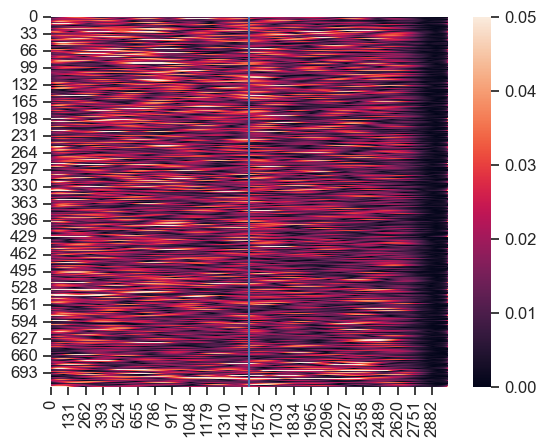

In [274]:
plt.close('all')
sns.heatmap(power[idx,:],vmin=0,vmax=0.05)
plt.axvline(1500)

In [133]:
window=[-1000,2000]

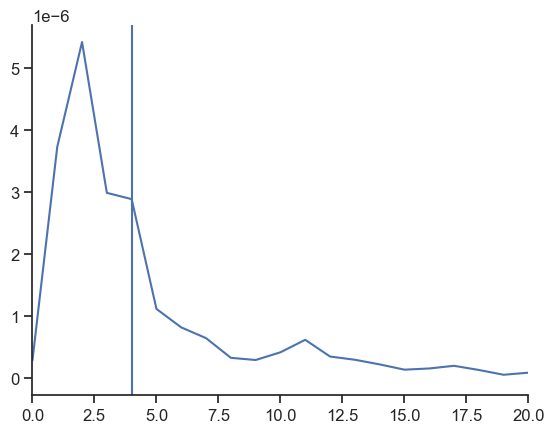

In [314]:
plt.close('all')
plt.plot(psd.mean(axis=0)) #128:160
plt.xlim(0,20)
plt.axvline(4)

In [309]:
ntrial

553

In [310]:
# date = '032823'
# aligned_lfp = epoch_aligned_lfp(date,'node_on','(trialerror==0) & (step==0)',[-1000,2000])

ntrial = aligned_lfp.shape[0]
ch = 150

psd = np.zeros((ntrial,501))
for nn in tqdm(range(ntrial)):
    ofc_signal = preprocess_LFP(aligned_lfp[nn,ch,:])
    freqs, psd[ch,:] = signal.welch(ofc_signal,fs=fs,nperseg=fs)

100%|██████████| 553/553 [00:02<00:00, 210.64it/s]


In [12]:
psd = np.zeros((96,501))
trial = 0
for ch in tqdm(range(96)):
    ofc_signal = preprocess_LFP(aligned_lfp[trial,ch,:])
    freqs, psd[ch,:] = signal.welch(ofc_signal,fs=fs,nperseg=fs)

  0%|          | 0/96 [00:00<?, ?it/s]


ValueError: sos array must be shape (n_sections, 6)

In [274]:
from fooof import FOOOFGroup
fg = FOOOFGroup()
fg.fit(freqs, psd, [2, 50])
fm = fg.get_fooof(ind=4, regenerate=True)
fm.print_results()
fm.plot()

Running FOOOFGroup across 96 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 1.00
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.



In [271]:
psd = np.zeros((96,501))
for ch in tqdm(range(96)):
    ofc_signal = preprocess_LFP(aligned_lfp[trial,ch,:])
    freqs, psd[ch,:] = signal.welch(ofc_signal,fs=fs,nperseg=fs)

100%|██████████| 96/96 [00:01<00:00, 68.62it/s]


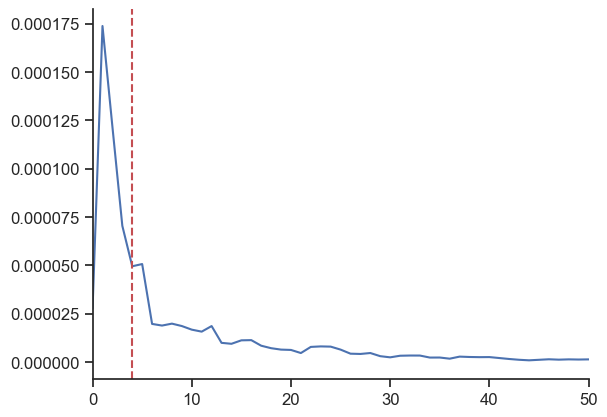

In [269]:
plt.close('all')
plt.plot(freqs.mean(axis=0),psd.mean(axis=0))
plt.xlim(0,50)
plt.axvline(4,color='r',ls='--')


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 1.00
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

                                                                                                  
                                   FOOOF - POWER SPECTRUM MODEL                                   
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offs

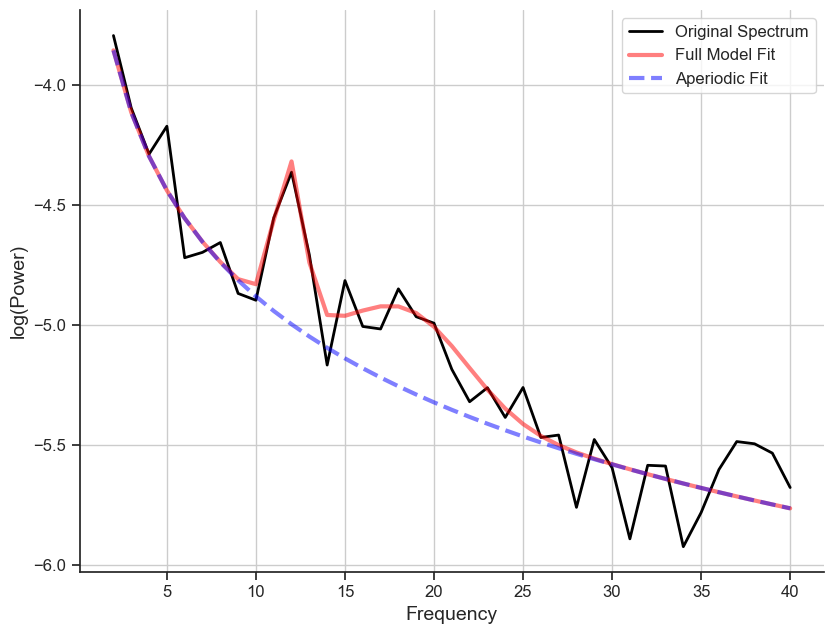

In [258]:
trial = 0
ofc_ch = 23
hpc_ch = 185
fs = 1000
ofc_signal = preprocess_LFP(aligned_lfp[trial,ofc_ch,:])
freqs, psd = signal.welch(ofc_signal,fs=fs,nperseg=fs)

# Initialize a FOOOF object
fm = FOOOF()

# Set the frequency range to fit the model
freq_range = [2, 40]

# Report: fit the model, print the resulting parameters, and plot the reconstruction
fm.report(freqs, psd, freq_range)
# plt.xlim(0,50)

In [247]:
print('  Peak Parameters \t Gaussian Parameters')
for peak, gauss in zip(fm.peak_params_, fm.gaussian_params_):
    print('{:5.2f} {:5.2f} {:5.2f} \t {:5.2f} {:5.2f} {:5.2f}'.format(*peak, *gauss))

  Peak Parameters 	 Gaussian Parameters
 4.52  0.31  0.56 	  4.52  1.28  0.28
 9.61  0.35  1.85 	  9.61  0.36  0.92
12.46  0.49  1.95 	 12.46  0.53  0.97
17.67  0.39  3.74 	 17.67  0.40  1.87
20.46  0.37  0.60 	 20.46  0.59  0.30
22.48  0.66  0.65 	 22.48  1.87  0.32
25.14  0.57  1.54 	 25.14  0.57  0.77
39.58  0.43  0.60 	 39.58  1.11  0.30
41.68  0.33  1.29 	 41.68  0.37  0.65
45.35  0.36  0.51 	 45.35  0.92  0.25


In [246]:
print('Aperiodic parameters: \n', fm.aperiodic_params_, '\n')

# Peak parameters
print('Peak parameters: \n', fm.peak_params_, '\n')

# Goodness of fit measures
print('Goodness of fit:')
print(' Error - ', fm.error_)
print(' R^2   - ', fm.r_squared_, '\n')

# Check how many peaks were fit
print('Number of fit peaks: \n', fm.n_peaks_)

Aperiodic parameters: 
 [-3.53549178  1.37114415] 

Peak parameters: 
 [[ 4.52367286  0.30569117  0.56319512]
 [ 9.60749721  0.34971518  1.84934431]
 [12.45629878  0.48926056  1.94885883]
 [17.67026533  0.3918492   3.74206275]
 [20.46064629  0.36554482  0.60123042]
 [22.4773774   0.65722108  0.64638385]
 [25.13743434  0.56575395  1.535854  ]
 [39.57797906  0.42796601  0.60105011]
 [41.67749021  0.32687672  1.29426171]
 [45.35086598  0.35548335  0.50864147]] 

Goodness of fit:
 Error -  0.05734780240194188
 R^2   -  0.9691538692892963 

Number of fit peaks: 
 10


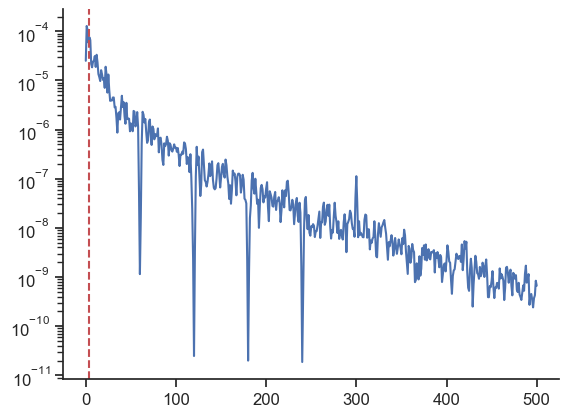

In [244]:
trial = 0
ofc_ch = 0
hpc_ch = 185
fs = 1000
ofc_signal = preprocess_LFP(aligned_lfp[trial,ofc_ch,:])
freqs, psd = signal.welch(ofc_signal,fs=fs,nperseg=fs)
plt.close('all')
plt.semilogy(freqs,psd)
plt.xlim(0,50)
plt.axvline(4,color='r',ls='--')

In [174]:
from scipy.signal import coherence
from fooof import FOOOF

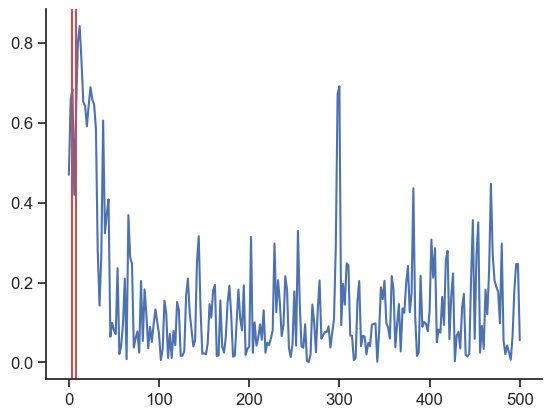

In [214]:
trial = 0
ofc_ch = 132
hpc_ch = 185
fs = 1000
ofc_signal = preprocess_LFP(aligned_lfp[trial,ofc_ch,:])
hpc_signal = preprocess_LFP(aligned_lfp[trial,hpc_ch,:])
f_coh, Cxy = coherence(ofc_signal,hpc_signal,fs=fs,nperseg=fs/2)
plt.close('all')
plt.plot(f_coh,Cxy)
# plt.xlim(0,100)
plt.axvline(4,color='r')
plt.axvline(8,color='r')
# plt.ylim(0,0.5)

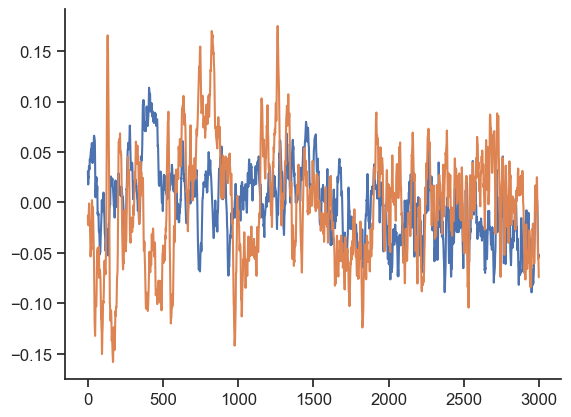

In [179]:
plt.close('all')
plt.plot(ofc_signal)
plt.plot(hpc_signal)

In [10]:
date = '031723'
aligned_lfp = epoch_aligned_lfp(date,'node_on','(trialerror==0) & (step==0)',[-1000,2000])